In [1]:
import numpy as np 
import cv2
import matplotlib.pyplot as plt
import skimage

In [2]:
def show_imgs(imgs, titles=None, arangement=None, places=None):
    nimg = len(imgs)

    if titles is None:
        titles = [f'img{i}' for i in range(1, nimg+1)]
    if arangement is None:
        X, Y = 1, nimg
    else:
        X, Y = arangement
    figsize = (5 * Y, 5 * X)

    plt.figure(figsize=figsize)
    for i, (img, title) in enumerate(zip(imgs, titles)):
        plt.subplot(X, Y, i+1 if places is None else places[i])
        plt.imshow(img, cmap='gray')
        plt.title(title)

    plt.show()

var: 0.10183385584213046


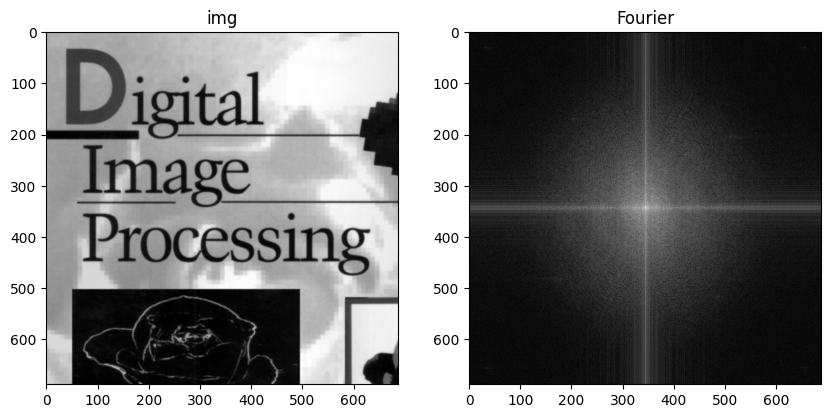

In [3]:
img = cv2.imread('imgs/img.tif', cv2.IMREAD_GRAYSCALE) / 255
fftImg = np.fft.fftshift(np.fft.fft2(img))
fftShiftImg = skimage.exposure.rescale_intensity(np.log(1 + abs(fftImg)), out_range=(0.0, 1.0))
print(f'var: {img.var()}')
show_imgs([img, fftShiftImg], ['img', 'Fourier'])

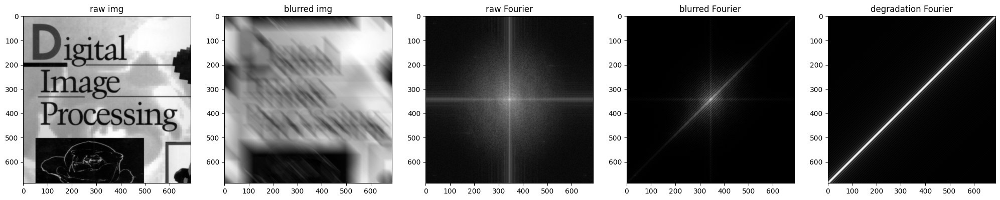

In [4]:
# Motion blur
W, H = img.shape
arr_u = np.arange(-(H//2), H-H//2)
arr_v = np.arange(-(W//2), W-W//2)
u, v = np.meshgrid(arr_u, arr_v)

T = 1
a, b = 0.1, 0.1
eps = 1e-10
m = np.pi * (u * a + v * b)

HH = T / (m+eps) * (np.sin(m + eps)) * np.exp(-1j * (m + eps))

fftImg_blur = fftImg * HH
img_blur = np.abs(np.fft.ifft2(fftImg_blur))

fftShiftImg_raw = skimage.exposure.rescale_intensity(np.log(1 + abs(fftImg)), out_range=(0.0, 1.0))
fftShiftImg_blur = skimage.exposure.rescale_intensity(np.log(1 + abs(fftImg_blur)), out_range=(0.0, 1.0))
fftShiftImg_deg = skimage.exposure.rescale_intensity(np.log(1 + abs(HH)), out_range=(0.0, 1.0))

show_imgs(
    [img, img_blur, fftShiftImg_raw, fftShiftImg_blur, fftShiftImg_deg],
    ['raw img', 'blurred img', 'raw Fourier', 'blurred Fourier', 'degradation Fourier']
)

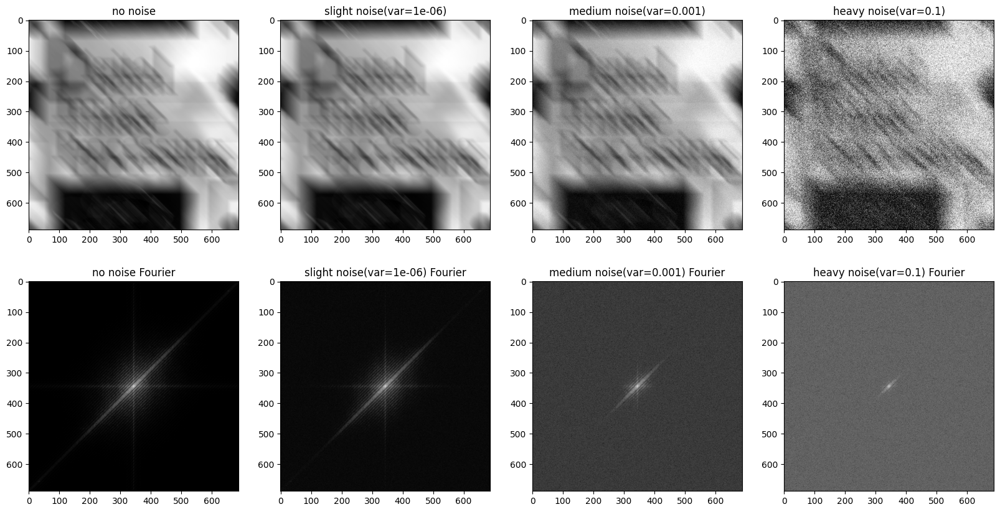

In [5]:
# Add Gaussian noise
def add_noise(img, mean=0, var=1):
    H, W = img.shape
    noise = np.random.normal(mean, var ** 0.5, img.shape)
    return np.clip(noise + img, 0, 1)

var_list= [0, 1e-6, 0.001, 0.1]
img_noises = [add_noise(img_blur, var=var) for var in var_list]
fftImg_noises = [np.fft.fftshift(np.fft.fft2(img_noise)) for img_noise in img_noises]
fftShiftImg_noises = [skimage.exposure.rescale_intensity(np.log(1 + abs(fftImg_noise)), out_range=(0.0, 1.0)) for fftImg_noise in fftImg_noises]

img_names = ['no noise', f'slight noise(var={var_list[1]})', f'medium noise(var={var_list[2]})', f'heavy noise(var={var_list[3]})']
fft_names = [i + ' Fourier' for i in img_names]

show_imgs(img_noises+fftShiftImg_noises, img_names+fft_names, arangement=(2, 4))

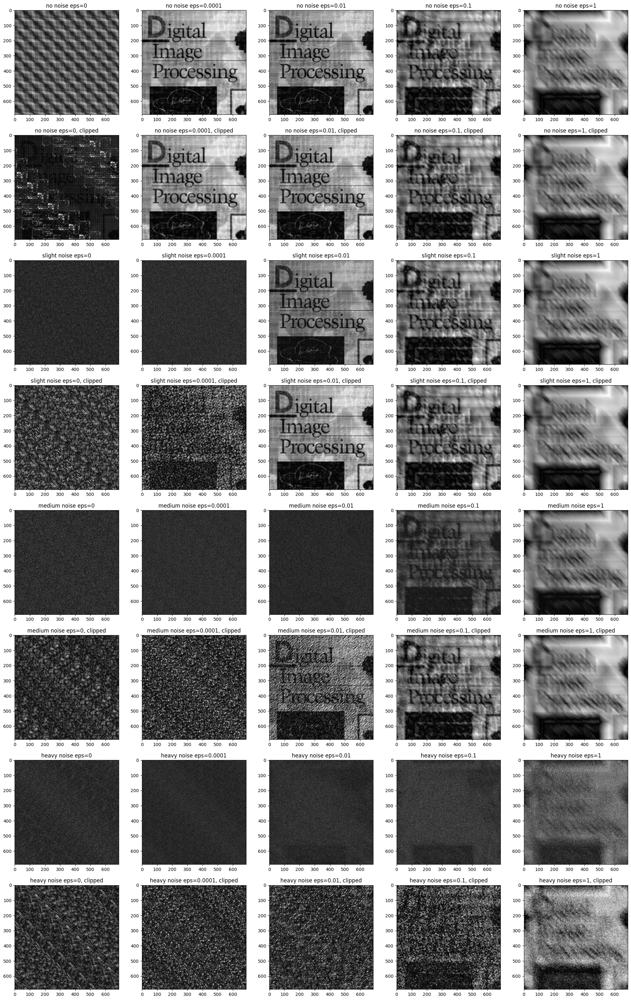

In [6]:
# Inverse filtering
def get_inverse(eps=1e-4, clip_size=None):
    HH_inverse = 1 / (HH + eps)
    if clip_size is not None:
        H_center, W_center = HH.shape 
        H_center //= 2
        W_center //= 2
        H_clip, W_clip = clip_size
        H_clip //= 2
        W_clip //= 2
        HH_inverse[H_center + H_clip:, :] = 0
        HH_inverse[:H_center - H_clip, :] = 0
        HH_inverse[:, W_center + W_clip:] = 0
        HH_inverse[:, :W_center - W_clip] = 0
    return HH_inverse

imgs = []
img_names = []
epss = [0, 1e-4, 1e-2, 1e-1, 1]
img_names_noise = ['no noise', 'slight noise', 'medium noise', 'heavy noise']

for fftImg_noise, img_name_noise in zip(fftImg_noises, img_names_noise):
    fftImg_noise_invs = [fftImg_noise * get_inverse(eps=eps, clip_size=None) for eps in epss]
    fftImg_noise_invs_clipped = [fftImg_noise * get_inverse(eps=eps, clip_size=(100, 100)) for eps in epss]
    imgs += [np.abs(np.fft.ifft2(fftImg_noise_inv)) for fftImg_noise_inv in fftImg_noise_invs]
    imgs += [np.abs(np.fft.ifft2(fftImg_noise_inv)) for fftImg_noise_inv in fftImg_noise_invs_clipped]
    img_names += [img_name_noise + f' eps={eps}' for eps in epss]
    img_names += [img_name_noise + f' eps={eps}, clipped' for eps in epss]
    
show_imgs(imgs, img_names, arangement=(8, 5))

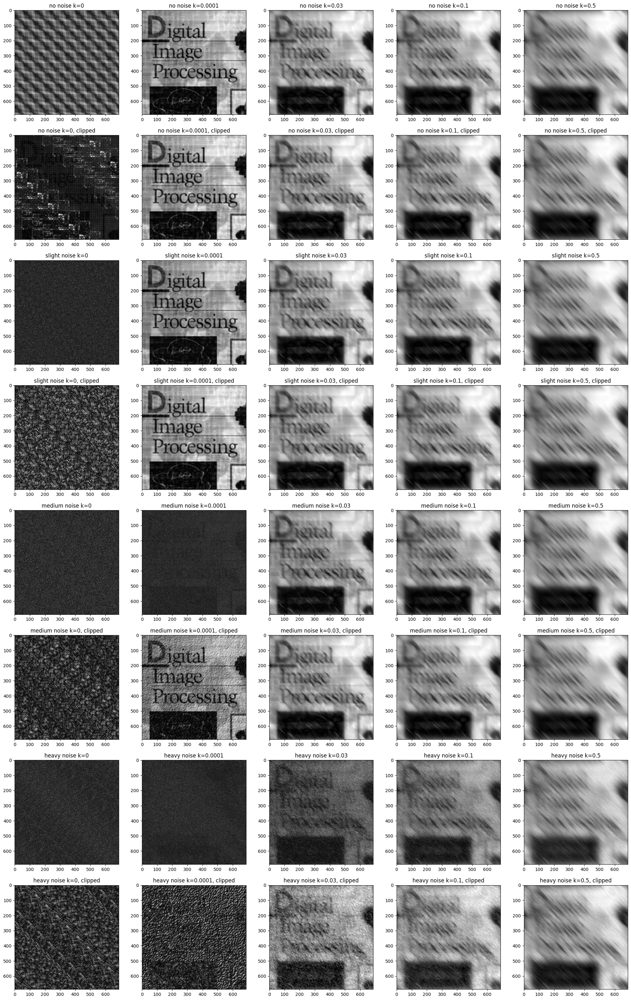

In [7]:
# Wiener filtering
def get_inverse_weiner(k=1e-2, clip_size=None):
    HH_inverse = 1 / (HH)
    HH_power = np.power(np.abs(HH), 2)
    HH_inverse = HH_inverse * (HH_power / (HH_power + k))
    if clip_size is not None:
        H_center, W_center = HH.shape 
        H_center //= 2
        W_center //= 2
        H_clip, W_clip = clip_size
        H_clip //= 2
        W_clip //= 2
        HH_inverse[H_center + H_clip:, :] = 0
        HH_inverse[:H_center - H_clip, :] = 0
        HH_inverse[:, W_center + W_clip:] = 0
        HH_inverse[:, :W_center - W_clip] = 0
    return HH_inverse

imgs = []
img_names = []
ks = [0, 1e-4, 3e-2, 1e-1, 5e-1]
img_names_noise = ['no noise', 'slight noise', 'medium noise', 'heavy noise']

for fftImg_noise, img_name_noise in zip(fftImg_noises, img_names_noise):
    fftImg_noise_invs = [fftImg_noise * get_inverse_weiner(k=k, clip_size=None) for k in ks]
    fftImg_noise_invs_clipped = [fftImg_noise * get_inverse_weiner(k=k, clip_size=(100, 100)) for k in ks]
    imgs += [np.abs(np.fft.ifft2(fftImg_noise_inv)) for fftImg_noise_inv in fftImg_noise_invs]
    imgs += [np.abs(np.fft.ifft2(fftImg_noise_inv)) for fftImg_noise_inv in fftImg_noise_invs_clipped]
    img_names += [img_name_noise + f' k={k}' for k in ks]
    img_names += [img_name_noise + f' k={k}, clipped' for k in ks]
    
show_imgs(imgs, img_names, arangement=(8, 5))

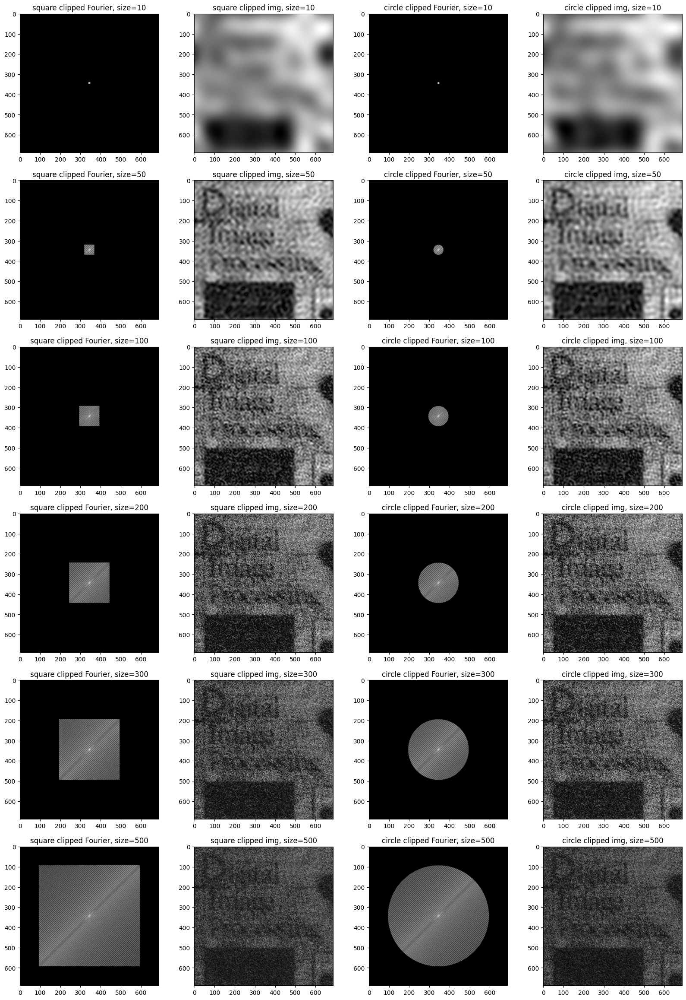

In [8]:
# clip size and shape impact
def get_inverse_weiner_clip(k=1e-2, clip_size=None, clip_option='square'):
    HH_inverse = 1 / (HH)
    HH_power = np.power(np.abs(HH), 2)
    HH_inverse = HH_inverse * (HH_power / (HH_power + k))
    if clip_size is not None:
        H_center, W_center = HH.shape 
        H_center //= 2
        W_center //= 2
        H_clip = W_clip = clip_size
        H_clip //= 2
        W_clip //= 2
        if clip_option == 'square':
            HH_inverse[H_center + H_clip:, :] = 0
            HH_inverse[:H_center - H_clip, :] = 0
            HH_inverse[:, W_center + W_clip:] = 0
            HH_inverse[:, :W_center - W_clip] = 0
        else:
            x = np.arange(HH.shape[1])
            y = np.arange(HH.shape[0])
            x, y = np.meshgrid(x, y)
            dists = np.sqrt((x - H_center) ** 2 + (y - W_center) ** 2)
            places = np.where(dists > H_clip)
            HH_inverse[places[0], places[1]] = 0
    return HH_inverse

fftImg_heavy_noise = fftImg_noises[3]
clip_sizes = [10, 50, 100, 200, 300, 500]

imgs = []
img_names = []
for clip_size in clip_sizes:
    fftImg_heavy_noise_inv = fftImg_heavy_noise * get_inverse_weiner_clip(clip_size=clip_size, clip_option='square')
    imgs.append(skimage.exposure.rescale_intensity(np.log(1 + abs(fftImg_heavy_noise_inv)), out_range=(0.0, 1.0)))
    imgs.append(np.abs(np.fft.ifft2(fftImg_heavy_noise_inv)))
    img_names.append(f'square clipped Fourier, size={clip_size}')
    img_names.append(f'square clipped img, size={clip_size}')

    fftImg_heavy_noise_inv = fftImg_heavy_noise * get_inverse_weiner_clip(clip_size=clip_size, clip_option='circle')
    imgs.append(skimage.exposure.rescale_intensity(np.log(1 + abs(fftImg_heavy_noise_inv)), out_range=(0.0, 1.0)))
    imgs.append(np.abs(np.fft.ifft2(fftImg_heavy_noise_inv)))
    img_names.append(f'circle clipped Fourier, size={clip_size}')
    img_names.append(f'circle clipped img, size={clip_size}')

show_imgs(imgs, img_names, arangement=(100, 4))